# Project 5 - Vehicle Detection and Tracking

## Load Needed Libraries

In [74]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import sklearn
import skimage

%matplotlib inline

## Histogram of Oriented Gradients (HOG)

### 1. Extract HOG Features

#### Load in Test Images

In [ ]:
test1 = mpimg.imread('training_data/test_v1.png')
test2 = mpimg.imread('training_data/test_n1.png')

plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.title('Test 1 - Vehicle')
plt.imshow(test1)

plt.subplot(1, 2, 2)
plt.imshow(test2)
plt.axis('off')
plt.title('Test 2 - Non-Vehicle')

#### Extract HOG Features

In [ ]:
from skimage.feature import hog

# Convert Image to HSV Color Space
test1_hsv = cv2.cvtColor(test1,cv2.COLOR_RGB2HSV)
test2_hsv = cv2.cvtColor(test2,cv2.COLOR_RGB2HSV)

# Extract V-Channel
test1_strip = test1_hsv[:,:,1]
test2_strip = test2_hsv[:,:,1]

# Extract HOG Features
fd1, test1_hog = hog(test1_strip, orientations=8, pixels_per_cell=(8, 8),
                    cells_per_block=(2, 2), visualise=True)

fd1, test2_hog = hog(test2_strip, orientations=8, pixels_per_cell=(8, 8),
                    cells_per_block=(2, 2), visualise=True)

# Show Features
plt.figure(figsize=(10,10))
plt.subplot(2, 2, 1)
plt.axis('off')
plt.title('Test 1 - Vehicle')
plt.imshow(test1_strip, cmap='gray')

plt.subplot(2, 2, 2)
plt.imshow(test2_strip, cmap='gray')
plt.axis('off')
plt.title('Test 2 - Non-Vehicle')

plt.subplot(2, 2, 3)
plt.axis('off')
plt.title('HOG - Vehicle')
plt.imshow(test1_hog, cmap='gray')

plt.subplot(2, 2, 4)
plt.imshow(test2_hog, cmap='gray')
plt.axis('off')
plt.title('Hog - Non-Vehicle')

#### Pull in Classroom Functions

In [75]:
import numpy as np
import cv2
from skimage.feature import hog

def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell), 
                            cells_per_block=(cell_per_block, cell_per_block), visualise=False, feature_vector=False)
        return features

def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))
                        
def color_hist(img, nbins=32):    #bins_range=(0, 256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

In [76]:
# Load Test Images
test_images_v = glob.glob('./training_data/vehicles/*.png')
test_images_n = glob.glob('./training_data/non-vehicles/*.png')

# Create Label Array
labels_v = np.ones(len(test_images_v), dtype=np.int)
labels_n = np.zeros(len(test_images_n), dtype=np.int)

train_v = []
train_n = []

pix_per_cell = 8
cell_per_block = 2
orient = 9

for img in test_images_v:
    temp = mpimg.imread(img)
    
    #temp = temp.astype(np.float32)/255

    temp_ycr = convert_color(temp, conv='RGB2YCrCb')

    temp_ch1 = temp_ycr[:,:,0]
    temp_ch2 = temp_ycr[:,:,1]
    temp_ch3 = temp_ycr[:,:,2]

    temp_hog1 = get_hog_features(temp_ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    temp_hog2 = get_hog_features(temp_ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    temp_hog3 = get_hog_features(temp_ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog_features = np.hstack((temp_hog1.ravel(), temp_hog2.ravel(), temp_hog3.ravel()))
    
    spatial_features = bin_spatial(temp_ycr)
    hist_features = color_hist(temp_ycr)

    test_features = np.hstack((spatial_features, hist_features, hog_features))
    train_v.append(test_features)

print('Finished loading vehicle images')

for img in test_images_n:
    temp = mpimg.imread(img)
    
    #temp = temp.astype(np.float32)/255

    temp_ycr = convert_color(temp, conv='RGB2YCrCb')

    temp_ch1 = temp_ycr[:,:,0]
    temp_ch2 = temp_ycr[:,:,1]
    temp_ch3 = temp_ycr[:,:,2]

    temp_hog1 = get_hog_features(temp_ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    temp_hog2 = get_hog_features(temp_ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    temp_hog3 = get_hog_features(temp_ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog_features = np.hstack((temp_hog1.ravel(), temp_hog2.ravel(), temp_hog3.ravel()))
    
    spatial_features = bin_spatial(temp_ycr)
    hist_features = color_hist(temp_ycr)

    test_features = np.hstack((spatial_features, hist_features, hog_features))
    train_n.append(test_features)

print('Finished loading non-vehicle images.')
print()

print('Number of vehicle samples: ',len(train_v), 'with ', labels_v.shape, 'labels.')
print('Number of non-vehicle samples: ',len(train_n), 'with ', labels_n.shape, 'labels.')

Finished loading vehicle images
Finished loading non-vehicle images.

Number of vehicle samples:  6941 with  (6941,) labels.
Number of non-vehicle samples:  8968 with  (8968,) labels.


### Create Classifier and Train

In [77]:
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
from sklearn.cross_validation import train_test_split

x_train = np.vstack((train_v, train_n)).astype(np.float64)
y_train = np.hstack((labels_v, labels_n))

# Fit a per-column scaler
X_scaler = StandardScaler().fit(x_train)

# Apply the scaler to X
scaled_X = X_scaler.transform(x_train)

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y_train, test_size=0.2, random_state=rand_state)

svc = LinearSVC()
svc.fit(X_train, y_train)

print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

Test Accuracy of SVC =  0.9953


In [ ]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block):
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg)
            hist_features = color_hist(subimg)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))

            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                
    return draw_img
    
ystart = 400
ystop = 656
scale = 1.5

image = mpimg.imread('training_data/test1.jpg')
draw_image = np.copy(image)

out_img = find_cars(draw_image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block)

plt.imshow(out_img)

In [ ]:
def process_video(img):
    
    ystart = 400
    ystop = 656
    scale = 1.25

    pix_per_cell = 8
    cell_per_block = 2
    orient = 9

    window_img = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block)
    
    return window_img

In [5]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [ ]:
project_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_clip = clip1.fl_image(process_video) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

## Create Heat Map

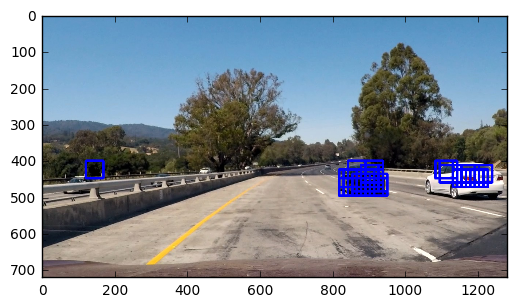

In [235]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block):
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    # Create Array for boxes
    box_list = []
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg)
            hist_features = color_hist(subimg)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))

            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                box_list.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
    
    return draw_img, box_list
    
ystart = 400
ystop = 656
scale = .75

image = mpimg.imread('training_data/test1.jpg')
draw_image = np.copy(image)

out_img, box_list = find_cars(draw_image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block)

plt.imshow(out_img)

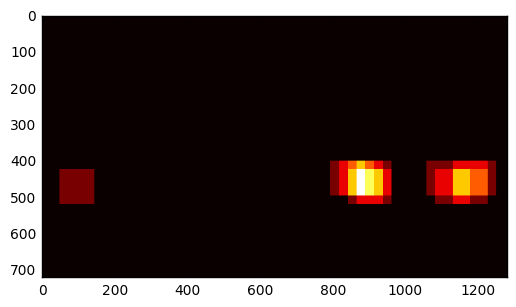

In [174]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes

heat = np.zeros_like(image[:,:,0]).astype(np.float)

heatmap = add_heat(heat, box_list)
plt.imshow(heatmap, cmap="hot")

2 cars found


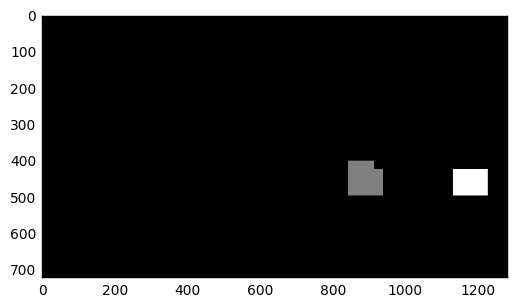

In [123]:
from scipy.ndimage.measurements import label

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

heatmap = apply_threshold(heatmap, 2)
labels = label(heatmap)
print(labels[1], 'cars found')
plt.imshow(labels[0], cmap='gray')

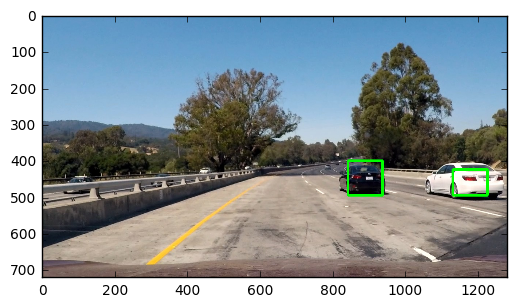

In [124]:
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,255,0), 6)
    # Return the image
    return img

# Read in the last image above
image = mpimg.imread('training_data/test1.jpg')

# Draw bounding boxes on a copy of the image
draw_img = draw_labeled_bboxes(np.copy(image), labels)

# Display the image
plt.imshow(draw_img)

In [263]:
# Create a Class to Store Information between Video Frames
class heat():
    def __init__(self):
        
        self.heatmap = np.zeros_like(image[:,:,0]).astype(np.float)
        self.heatmap_list = []
        

In [264]:
# Define a Function that Finds Cars Quickly
def find_cars_fast(img, svc, X_scaler, scale, ystart, ystop, orient=9, pix_per_cell=8, cell_per_block=2):
    
    scaled_img = img.astype(np.float32)/255
    
    img_tosearch = scaled_img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    # Create Array for boxes
    box_list = []
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg)
            hist_features = color_hist(subimg)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))

            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                box_list.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
        
        current_heatmap = add_heat(np.zeros_like(image[:,:,0]).astype(np.float), box_list)
        
    return current_heatmap

In [265]:
def process_video_fast(img):

    heatmap1 = find_cars_fast(img, svc, X_scaler, scale=1.0, ystart=400, ystop=528)
    heatmap2 = find_cars_fast(img, svc, X_scaler, scale=1.5, ystart=400, ystop=656)
    heatmap3 = find_cars_fast(img, svc, X_scaler, scale=2.0, ystart=400, ystop=656)

    current_heatmap = heatmap1 + heatmap2 + heatmap3
    heat.heatmap = heat.heatmap + current_heatmap
    heat.heatmap_list.append(current_heatmap)

    if len(heat.heatmap_list) > 10:
        remove_heat = heat.heatmap_list.pop(0)
        heat.heatmap -= remove_heat

    labelmap = apply_threshold(heat.heatmap, 3)
    labels = label(labelmap)        
    draw_img = draw_labeled_bboxes(np.copy(img), labels)

    return draw_img

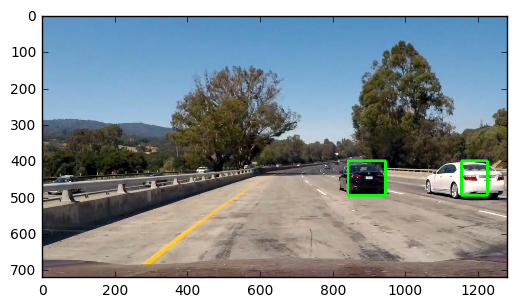

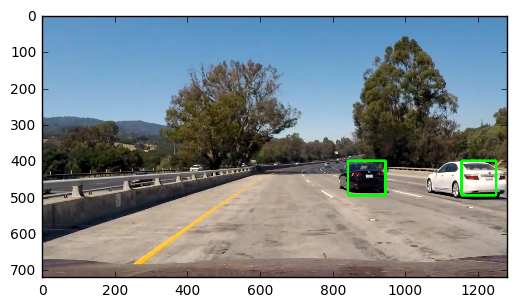

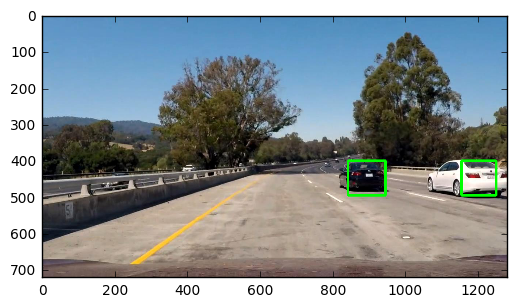

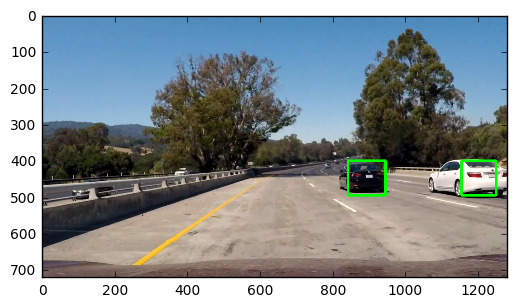

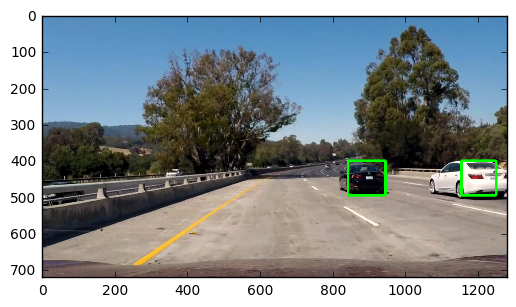

...

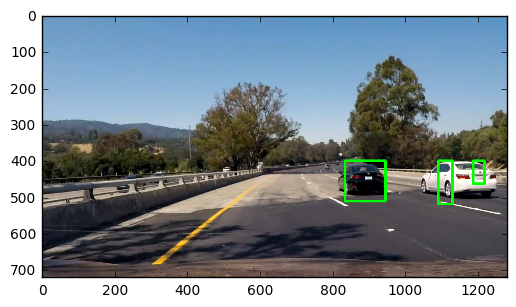

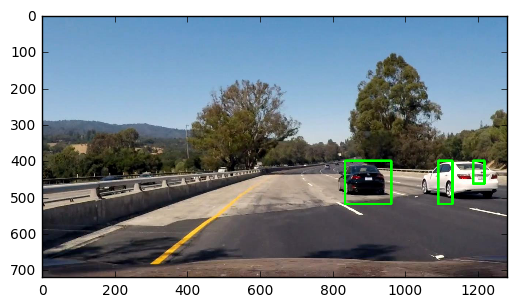

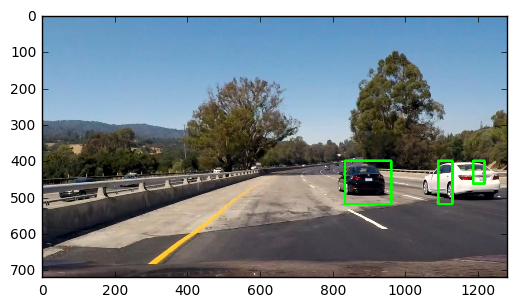

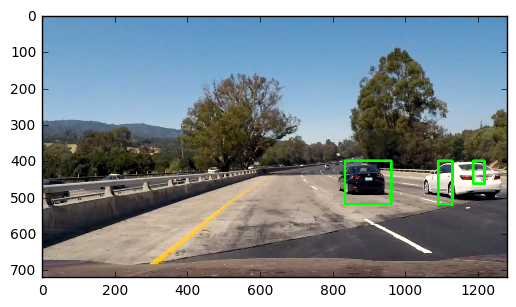

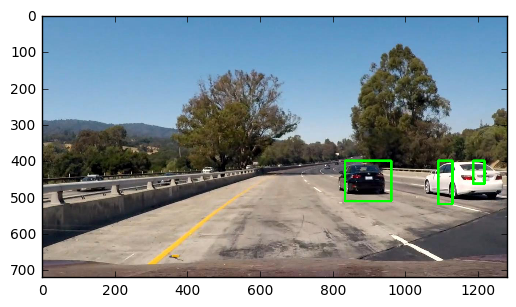

In [261]:
test_images = glob.glob('./training_data/seq/*.jpg')

heat = heat()

for img in test_images:
    temp = mpimg.imread(img)

    out_img = process_video_fast(temp)
    
    plt.figure()
    plt.imshow(out_img)

In [251]:
heat = heat()

project_output_fast = 'test_video_fast.mp4'
clip1 = VideoFileClip("test_video.mp4")
project_clip_fast = clip1.fl_image(process_video_fast) #NOTE: this function expects color images!!
%time project_clip_fast.write_videofile(project_output_fast, audio=False)

[MoviePy] >>>> Building video test_video_fast.mp4
[MoviePy] Writing video test_video_fast.mp4


 97%|███████████████████████████████████████████████████████████████████████████████▉  | 38/39 [01:17<00:01,  1.99s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_fast.mp4 

Wall time: 1min 18s


In [262]:
del heat

In [266]:
heat = heat()

project_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_clip = clip1.fl_image(process_video_fast) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [29:27<00:01,  1.40s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 29min 27s
